In [1]:
import pandas as pd
import shap
import matplotlib.pyplot as plt
import sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import os

In [2]:
shap.initjs()

In [3]:
os.chdir(r'C:\Users\hdey\Downloads\HimFac\PCA_USGAC')

In [4]:
raw_data = pd.read_csv('Destroyed_FL_dmg19k.csv')
data = raw_data.drop(columns=['geometry'])
data.head(5)

,class,Elevation,Slope,Soil_Moisture,Precip91,DisRiv,NDVI,TWI_Fil2,DD,PopDen,BuildingHeight,Dis_Road,POV,Minority,NoHSD,Age65,Age5
0,0,0,0.002225,0,134.295761,0.000000,-0.506900,3.695495,4.989536,0.0,5,0.000828,0.0,0.0,0.0,0.0,0
1,0,11,0.364776,24,132.059341,3142.822510,0.610449,3.067967,1.333287,0.0,2,0.001995,0.0,0.0,0.0,0.0,0
2,0,9,0.209056,22,122.790253,1994.257080,0.256436,3.748312,3.243583,0.0,3,0.002197,0.0,0.0,0.0,0.0,0
3,0,18,0.287196,19,107.747169,546.414978,0.662350,-0.854100,3.450593,0.0,1,0.003044,0.0,0.0,0.0,0.0,0
4,0,7,0.103189,14,99.007423,705.165649,-0.002193,0.327504,2.792220,0.0,3,0.003191,0.0,0.0,0.0,0.0,0


In [5]:
X = data.iloc[:, 1:17]
y = data['class']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [6]:
# Train a model
model = RandomForestClassifier(max_depth=15, n_estimators=500, min_samples_split = 5, random_state=42)
model.fit(X_train, y_train)

RandomForestClassifier(max_depth=15, min_samples_split=5, n_estimators=500,
                       random_state=42)

In [7]:
X_train_summary = shap.kmeans(X_train, 10)

In [8]:
ex = shap.KernelExplainer(model.predict, X_train_summary)
shap_values = ex.shap_values(X_test.iloc[0, :])

  0%|          | 0/10907 [00:00<?, ?it/s]

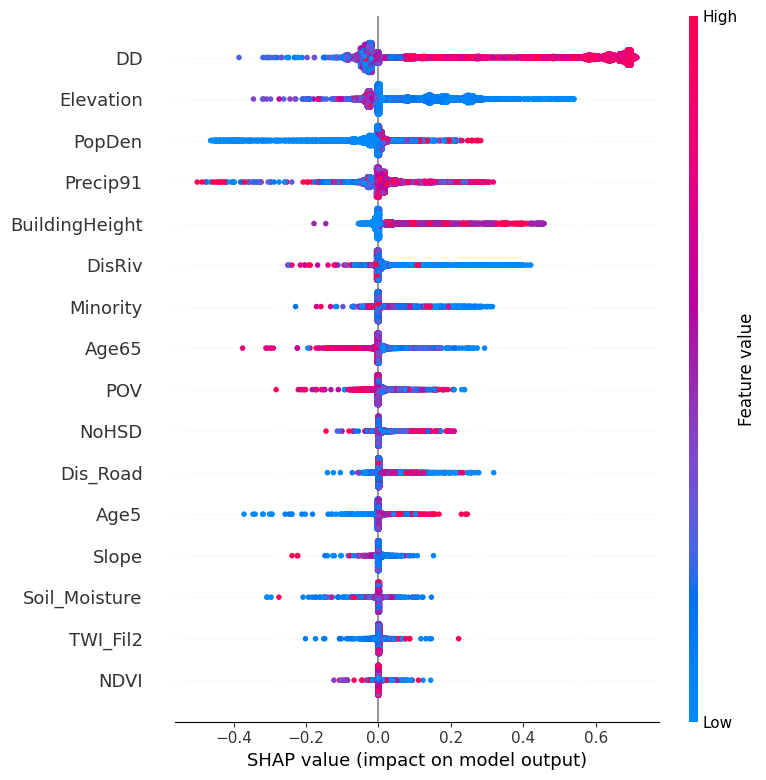

In [11]:
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

In [28]:
# Explain model predictions using SHAP
explainer = shap.TreeExplainer(model)

In [32]:
shap_values1 = explainer.shap_values(X_test)

In [47]:
print(len(shap_values))  # Should be 2
print(shap_values1.shape)  # Should match X_test.shape


10907
(10907, 16, 2)


In [42]:
print(X_test.shape) 

(10907, 16)


In [83]:
shap_values_class1 = shap_values1[:, :, 1]

# Select subset of 100 samples
X_subset = X_test.iloc[:10000]
shap_subset = shap_values_class1[:10000]

# Plot
shap.initjs()
shap.force_plot(
    explainer.expected_value[1],  # base value for class 1
    shap_subset,
    X_subset
)

C:\Users\hdey\AppData\Roaming\Python\Python311\site-packages\shap\plots\_force.py:211: UserWarning: shap.plots.force is slow for many thousands of rows, try subsampling your data.
  warnings.warn("shap.plots.force is slow for many thousands of rows, try subsampling your data.")


In [88]:
# Select subset of 100 samples
X_subset1 = X_test.iloc[:1000]
shap_subset1 = shap_values_class1[:1000]

# Plot
shap.initjs()
shap.force_plot(
    explainer.expected_value[1],  # base value for class 1
    shap_subset1,
    X_subset1
)                # Feature values with column names


In [89]:
import pandas as pd

# Step 1: Create DataFrame from SHAP values
shap_df = pd.DataFrame(shap_subset1, columns=X_subset1.columns, index=X_subset1.index)

# Step 2: Optionally prefix SHAP columns for clarity
shap_df = shap_df.add_prefix('shap_')

# Step 3: Concatenate original features and SHAP values
combined_df = pd.concat([X_subset1, shap_df], axis=1)

# Step 4: Export to CSV
combined_df.to_csv('X_and_SHAP_subset.csv', index=False)
